In [22]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (20, 30)
import numpy as np
from utils import imread, imshow

# Hough Transform

In [23]:
from detectors import Canny, HoughTransform

Canny algorithm steps:


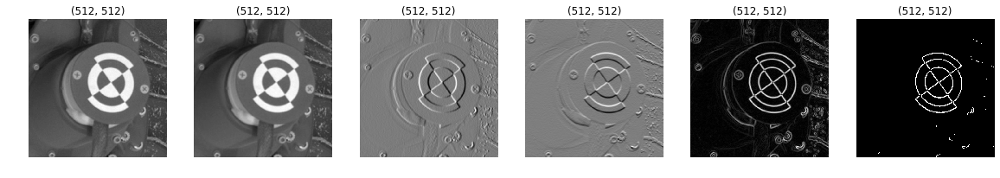

Hough space:


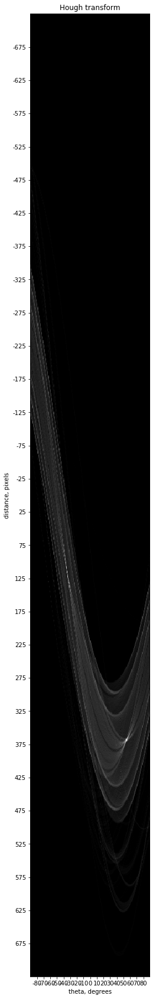

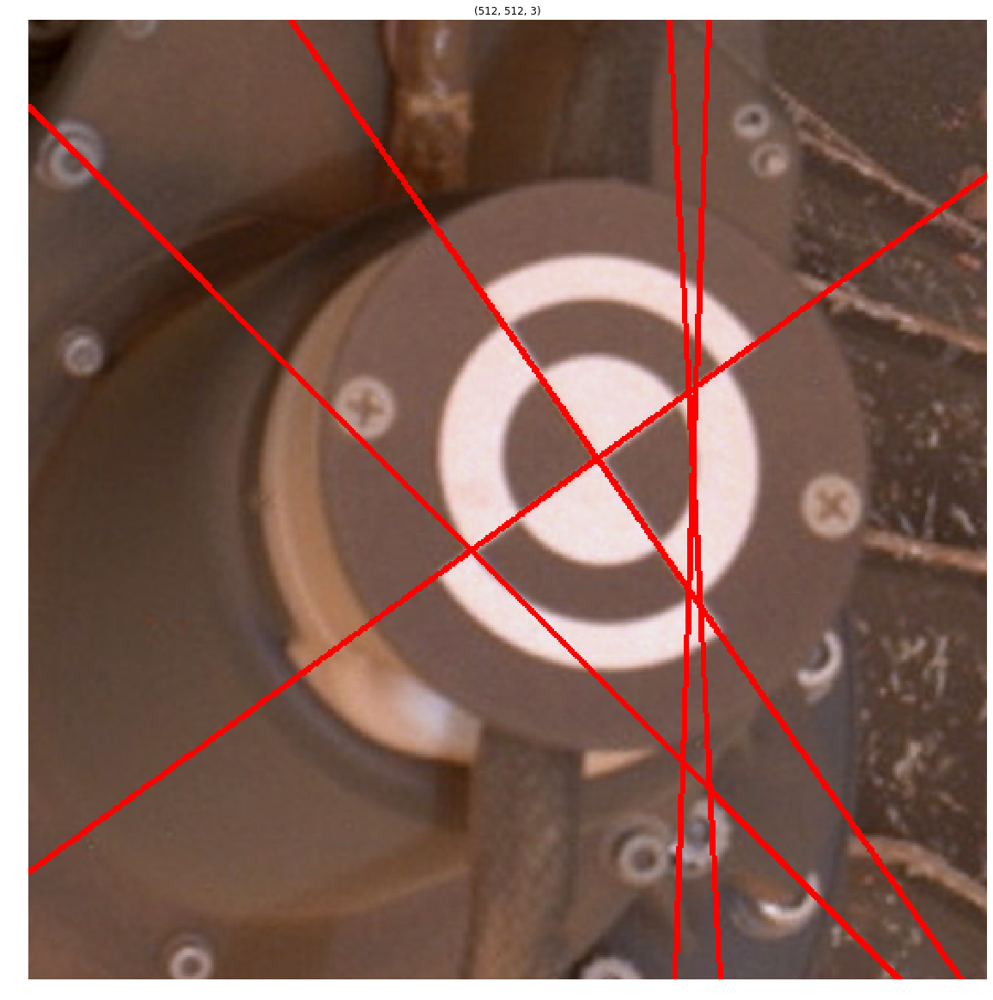

Lines (rho, theta):
[[ 1.15000000e+02 -6.10865238e-01]
 [ 3.68000000e+02  9.42477796e-01]
 [-3.30000000e+01 -7.85398163e-01]
 [ 3.63000000e+02  3.49065850e-02]
 [ 3.42000000e+02 -5.23598776e-02]]


In [61]:
image_path = "./materials-module1/res/marker_cut_rgb_512.png"
N = 5
image = imread(image_path)

canny = Canny(image)
canny.getEdges()
print("Canny algorithm steps:")
canny.showSteps()

print("Hough space:")
ht = HoughTransform(image)
ht.getSpace(show=True);
ht.getLines(N, show=True);
print("Lines (rho, theta):")
print(np.array(ht.lines).T)

# FAST & BRIEF 

In [24]:
from detectors import FAST
from descriptors import BRIEF

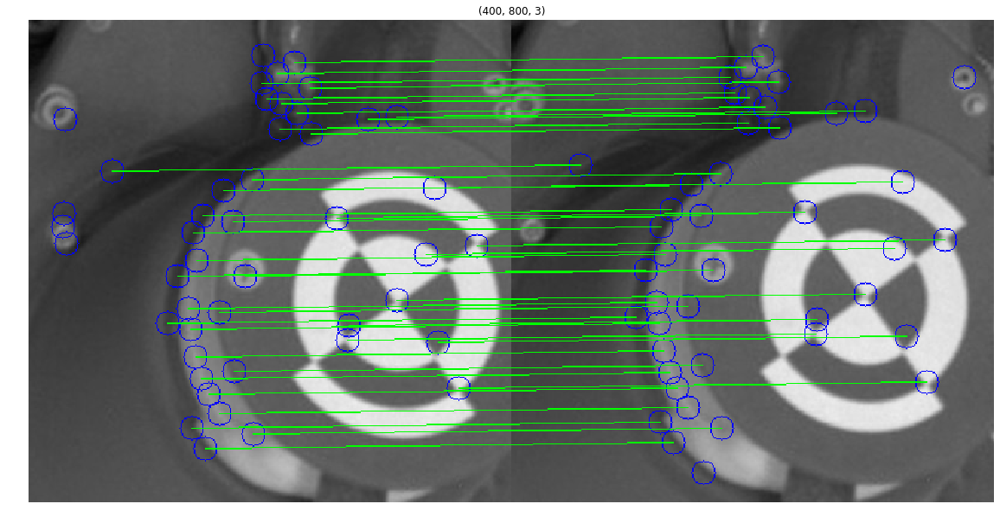

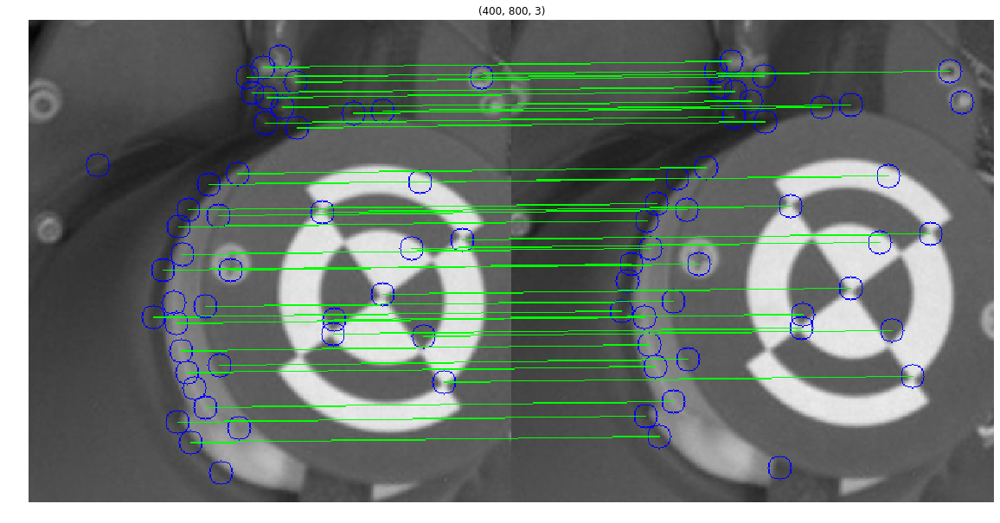

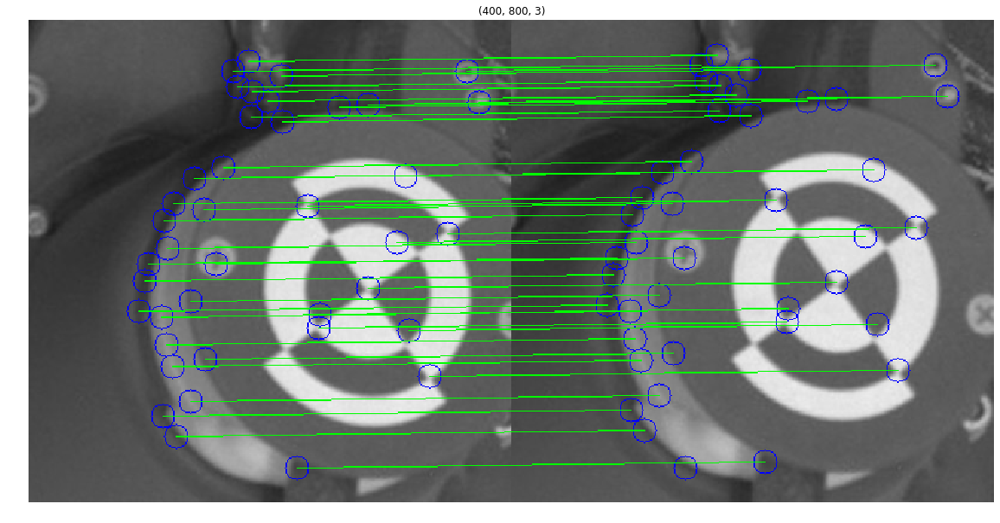

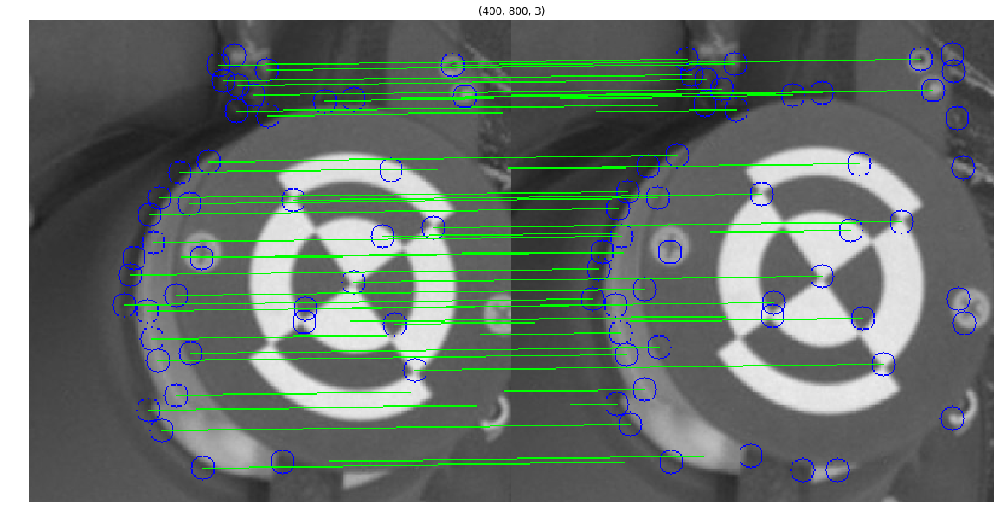

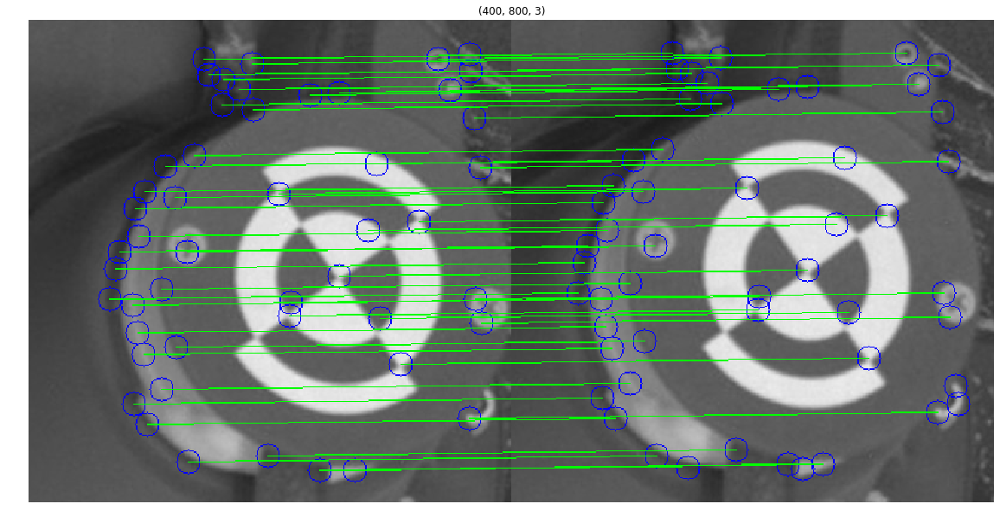

...

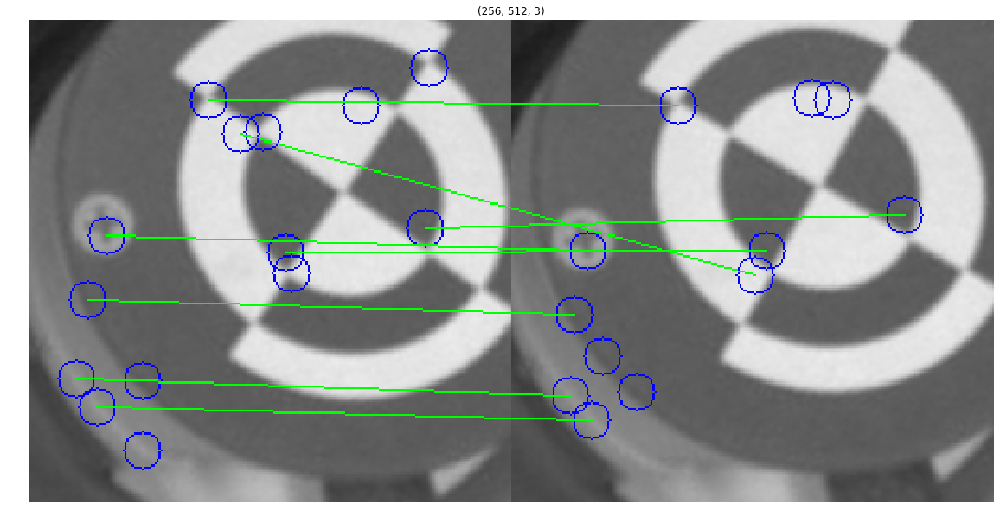

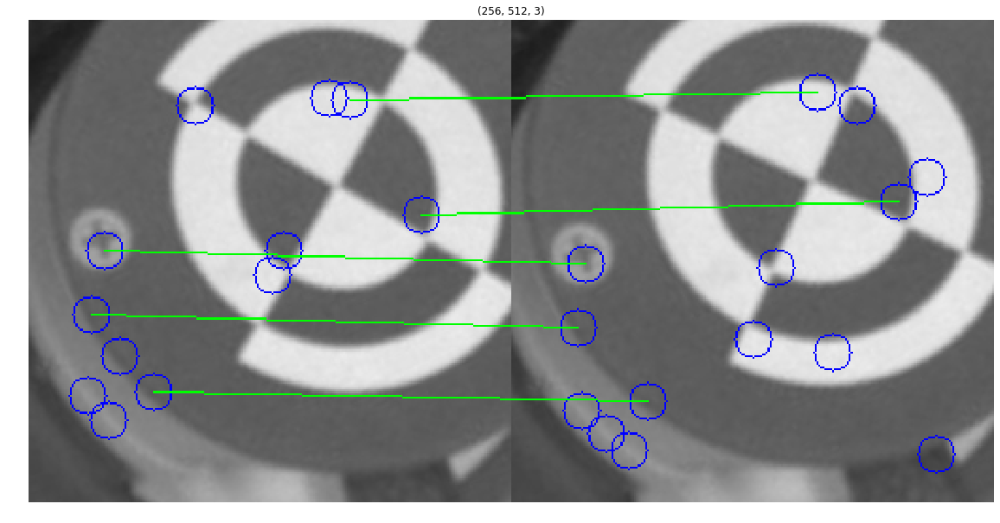

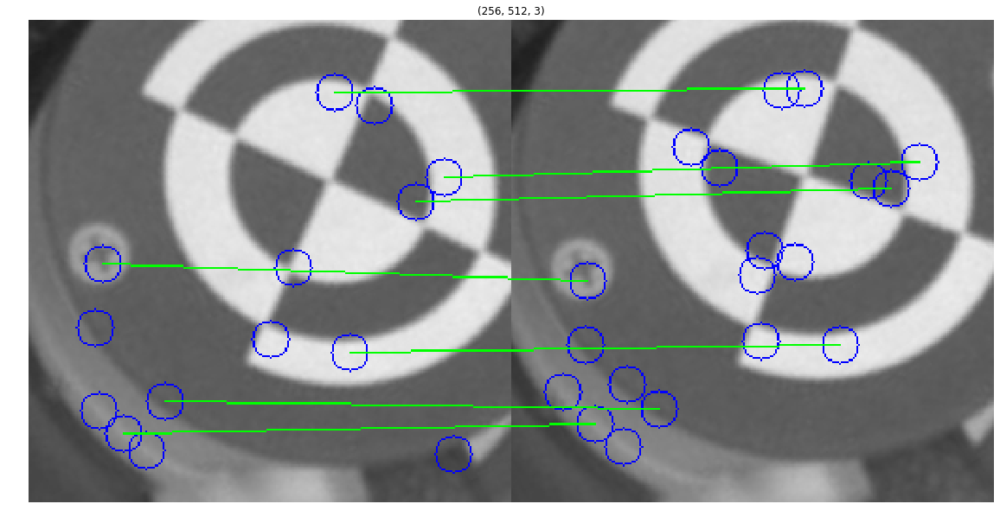

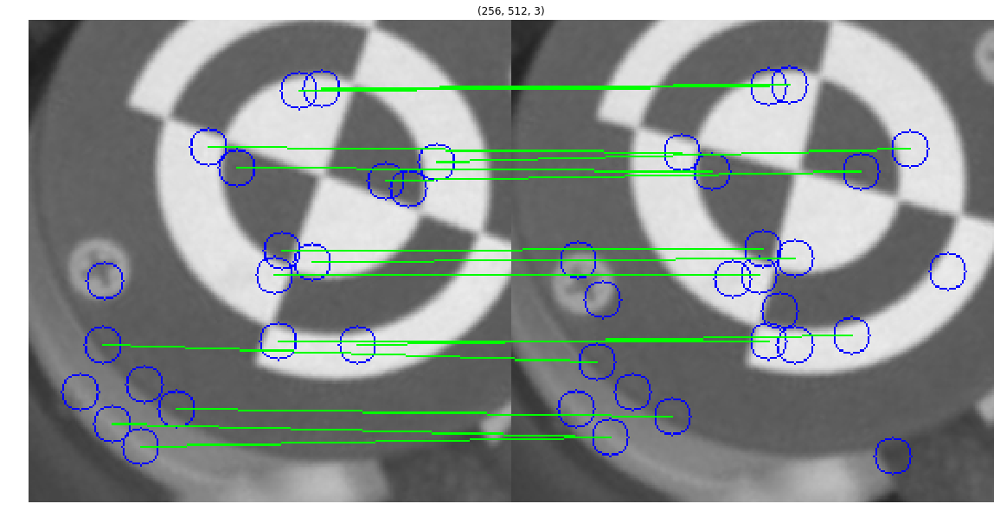

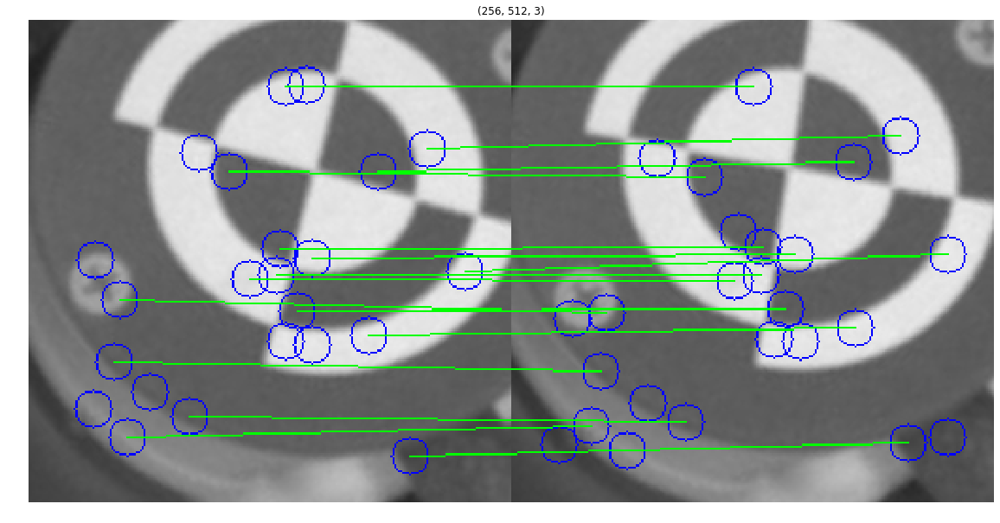

In [21]:
import cv2
from utils import gaussian_blur
from test_module1 import match_brute_force

img_in_path = "materials-module1/res/tracking/"

brief = BRIEF(bin_descriptor_size=512, patch_size=49)

def detect_keypoints_and_calculate_descriptors(img):
    img_blur = gaussian_blur(img, 11, 2.0)
    kp_arr = FAST(img_blur, denoise_sigma=None).getKeypoints(threshold=1,
                                                             min_distance=10,
                                                             threshold_rel=0.15)
    kp_arr, descr_arr = brief.describe(img_blur, kp_arr, denoise_sigma=None)
    kp_arr = list(map(lambda pt: (pt[1], pt[0]), kp_arr))
    return kp_arr, descr_arr

for test_name in ['translation_', 'translation_noise_', 'rotation_2_', 'rotation_5_']:
    for frame_idx in range(9):
        # read two frames
        img0_fpath = img_in_path + test_name + str(frame_idx) + '.png'
        img0 = cv2.imread(img0_fpath, cv2.IMREAD_GRAYSCALE)

        img1_fpath = img_in_path + test_name + str(frame_idx+1) + '.png'
        img1 = cv2.imread(img1_fpath, cv2.IMREAD_GRAYSCALE)

        rows = img0.shape[0]
        cols = img0.shape[1]

        # detect keypoints and calculate descriptors
        kp0, descr0 = detect_keypoints_and_calculate_descriptors(img0.copy())
        kp1, descr1 = detect_keypoints_and_calculate_descriptors(img1.copy())

        # match
        match_arr = match_brute_force(descr0, descr1)

        # draw on one image
        img_both = np.zeros((rows, cols*2), np.uint8)
        img_both[:, 0:cols] = img0
        img_both[:, cols:cols*2] = img1
        img_both_bgr = cv2.cvtColor(img_both, cv2.COLOR_GRAY2BGR)

        # keypoints as red circles
        for i in range(len(kp0)):
            kp = kp0[i]
            x = kp[0]
            y = kp[1]
            cv2.circle(img_both_bgr, (x, y), 10, (0, 0, 255))

        for i in range(len(kp1)):
            kp = kp1[i]
            x = kp[0] + cols
            y = kp[1]
            cv2.circle(img_both_bgr, (x, y), 10, (0, 0, 255))

        # matches as green lines
        for pair in match_arr:
            x0 = kp0[pair[0]][0]
            y0 = kp0[pair[0]][1]
            x1 = kp1[pair[1]][0] + cols
            y1 = kp1[pair[1]][1]
            cv2.line(img_both_bgr, (x0, y0), (x1, y1), (0, 255, 0))

        # show image and wait for key press
        imshow(img_both_bgr)